In [1]:
import cupy as cp
import matplotlib.pyplot as plt
import pandas as pd
import sys
from types import SimpleNamespace
import warnings
warnings.filterwarnings("ignore", message=f".*peer.*")


sys.path.insert(0, '..')
from utils import *
from rec import Rec

%matplotlib inline

astropy module not found
olefile module not found


## Sizes and propagation settings

In [2]:
energy = 33.5
wavelength = 1.24e-09 / energy
z1 = 5.5*1e-3-1.286*1e-3  # [m] position of the sample
detector_pixelsize = 3.03751e-6
focusToDetectorDistance = 1.28  # [m]
# adjustments for the cone beam
z2 = focusToDetectorDistance - z1
distance = (z1 * z2) / focusToDetectorDistance
magnification = focusToDetectorDistance / z1
voxelsize = float(cp.abs(detector_pixelsize / magnification))
path = f"/data/vnikitin/ESRF/ID16A/20240924/Chip/Chip_010nm_nfpPSEUDO_RANDOM/"
voxelsize

1.0000052453125e-08

In [3]:
args = SimpleNamespace()

args.ngpus = 4#int(sys.args[1])
args.lam = 0.05#float(sys.args[2])

args.n = 2048
args.npsi = args.n+2*args.n // 4+args.n // 4
args.pad =  args.n // 4
args.nq = args.n + 2 * args.pad
args.ex = 4
args.npatch = args.nq + 2 * args.ex
args.npos = 16
args.nchunk = 4

args.voxelsize = voxelsize
args.wavelength = wavelength
args.distance = distance
args.eps = 1e-12
args.rho = [1, 2, 0.1]
args.crop = args.npsi//2#2 * args.pad
args.path_out = f"/data/vnikitin/ESRF/ID16A/20240924_rec0224/Chip_nfp10nm/{args.lam}/"

args.niter = 10000
args.err_step = 32
args.vis_step = 64
args.method = "BH-CG"
args.show = True

# create class
cl_rec = Rec(args)

## read data

In [4]:
import h5py

with h5py.File(f"{path}/Chip_010nm_nfpPSEUDO_RANDOM0000.h5") as fid:
    data = fid["/entry_0000/measurement/data"][: args.npos].astype("float32")

with h5py.File(f"{path}/Chip_010nm_nfpPSEUDO_RANDOM0000.h5") as fid:
    ref = fid["/entry_0000/measurement/data"][:].astype("float32")
with h5py.File(f"{path}/dark_0000.h5") as fid:
    dark = fid["/entry_0000/measurement/data"][:].astype("float32")

with h5py.File(f'{path}Chip_010nm_nfpPSEUDO_RANDOM0000.h5','r') as fid:
    spz = np.array(str(np.array(str(np.array(fid['/entry_0000/instrument/PCIe/header/spz']))[1:]))[1:-1].split(' '),dtype='float32')*1e-6/voxelsize
    spy = np.array(str(np.array(str(np.array(fid['/entry_0000/instrument/PCIe/header/spy']))[1:]))[1:-1].split(' '),dtype='float32')*1e-6/voxelsize


pos_init = np.zeros([args.npos,2],dtype='float32')
pos_init[:,1] = spy
pos_init[:,0] = -spz
# pos_init=-pos_init

# plt.plot(pos_init[:,1],pos_init[:,0],'.')
# print(spz)
# print(spy)


# remove outliers from data

65
66
64
72
70
58
59
54
70
51
57
59
49
57
55
50
43


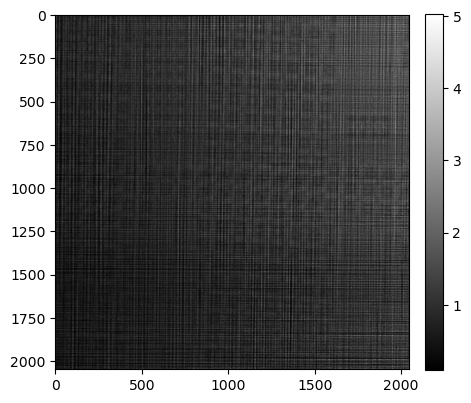

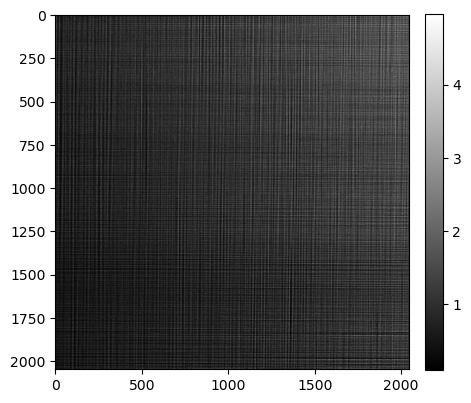

In [5]:
import cupyx.scipy.ndimage as ndimage


def remove_outliers(data, dezinger, dezinger_threshold):
    res = data.copy()
    w = [dezinger, dezinger]
    for k in range(data.shape[0]):
        data0 = cp.array(data[k])
        fdata = ndimage.median_filter(data0, w)
        print(np.sum(np.abs(data0 - fdata) > fdata * dezinger_threshold))
        res[k] = np.where(
            np.abs(data0 - fdata) > fdata * dezinger_threshold, fdata, data0
        ).get()
    return res


dark = np.mean(dark, axis=0)
ref = np.mean(ref, axis=0)
data -= dark
ref -= dark

data[data < 0] = 0
ref[ref < 0] = 0
data[:, 1320//3 : 1320//3 + 25//3 , 890//3 : 890//3 + 25//3 ] = data[
    :, 1280//3 : 1280//3 + 25//3 , 890//3 : 890//3 + 25//3 
]
ref[1320//3 : 1320//3 + 25//3 , 890//3 : 890//3 + 25//3 ] = ref[
    1280//3 : 1280//3 + 25//3 , 890//3 : 890//3 + 25//3 
]

data = remove_outliers(data, 5, 0.995)
ref = remove_outliers(ref[None], 5, 0.995)[0]

data /= np.mean(ref)
ref /= np.mean(ref)

data[np.isnan(data)] = 1
ref[np.isnan(ref)] = 1

mshow(data[0],args.show)
mshow(ref,args.show)

# initial guess for the object

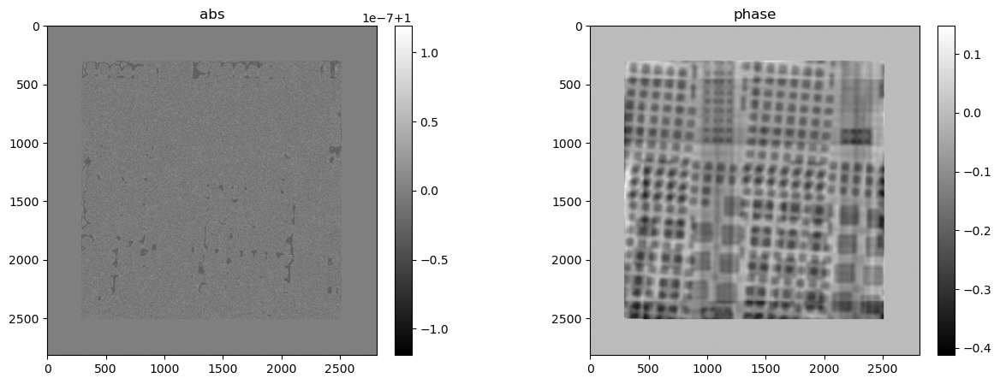

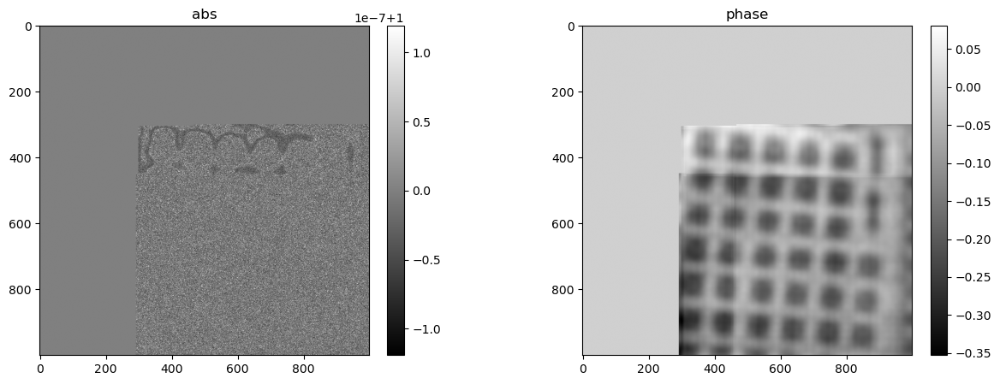

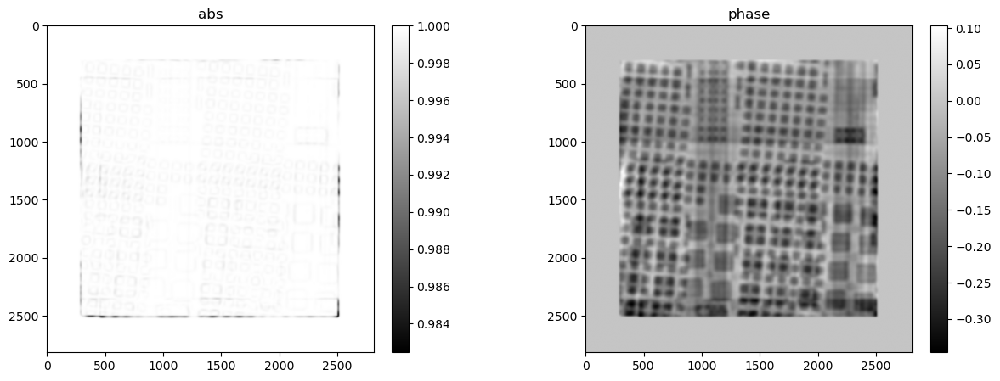

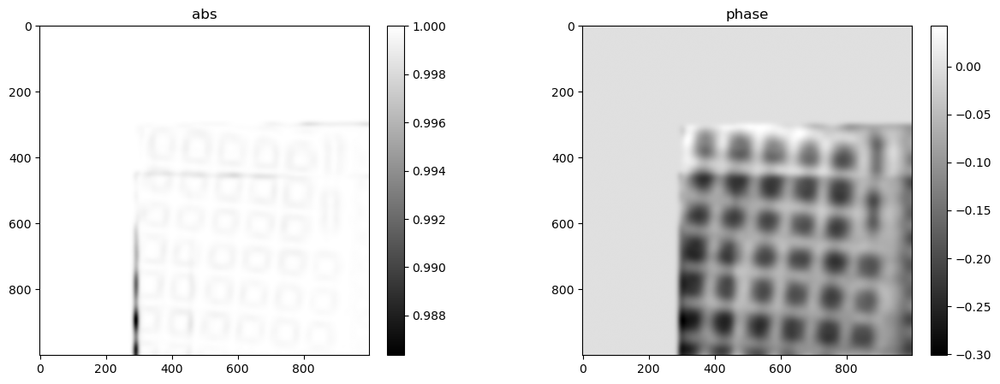

In [6]:
def Paganin(data, wavelength, voxelsize, delta_beta, alpha):
    fx = cp.fft.fftfreq(data.shape[-1], d=voxelsize).astype("float32")
    [fx, fy] = cp.meshgrid(fx, fx)
    rad_freq = cp.fft.fft2(data)
    taylorExp = 1 + wavelength * distance * cp.pi * (delta_beta) * (fx**2 + fy**2)
    numerator = taylorExp * (rad_freq)
    denominator = taylorExp**2 + alpha
    phase = cp.log(cp.real(cp.fft.ifft2(numerator / denominator)))
    phase = delta_beta * 0.5 * phase
    return phase


def rec_init(rdata, ipos_init):
    recMultiPaganin = cp.zeros([args.npsi, args.npsi], dtype="float32")
    recMultiPaganinr = cp.zeros(
        [args.npsi, args.npsi], dtype="float32"
    )  # to compensate for overlap
    for j in range(0, args.npos):
        r = cp.array(rdata[j])
        r = Paganin(r, wavelength, voxelsize, 24.05, 1e-2)
        rr = r * 0 + 1  # to compensate for overlap
        rpsi = cp.zeros([args.npsi, args.npsi], dtype="float32")
        rrpsi = cp.zeros([args.npsi, args.npsi], dtype="float32")
        stx = args.npsi // 2 - ipos_init[j, 1] - args.n // 2
        endx = stx + args.n
        sty = args.npsi // 2 - ipos_init[j, 0] - args.n // 2
        endy = sty + args.n
        rpsi[sty:endy, stx:endx] = r
        rrpsi[sty:endy, stx:endx] = rr

        recMultiPaganin += rpsi
        recMultiPaganinr += rrpsi

    recMultiPaganinr[np.abs(recMultiPaganinr) < 5e-2] = 1
    recMultiPaganin /= recMultiPaganinr
    recMultiPaganin = np.exp(1j * recMultiPaganin)
    return recMultiPaganin


ipos_init = np.round(np.array(pos_init)).astype("int32")
rdata = np.array(data / (ref + 1e-5))
psi_init = rec_init(rdata, ipos_init)
mshow_polar(psi_init,args.show)
mshow_polar(psi_init[:1000, :1000],args.show)

# smooth borders
v = cp.arange(-args.npsi // 2,args.npsi // 2) / args.npsi
[vx, vy] = cp.meshgrid(v, v)
v = cp.exp(-1000 * (vx**2 + vy**2)).astype("float32")

psi_init = cp.fft.fftshift(cp.fft.fftn(cp.fft.fftshift(psi_init)))
psi_init = cp.fft.fftshift(cp.fft.ifftn(cp.fft.fftshift(psi_init * v))).astype(
    "complex64"
)
v=[]
mshow_polar(psi_init,args.show)
mshow_polar(psi_init[:1000, :1000],args.show)

# rdata = v = []

#### Initial guess for the probe calculated by backpropagating the square root of the reference image
#### Smooth the probe borders for stability

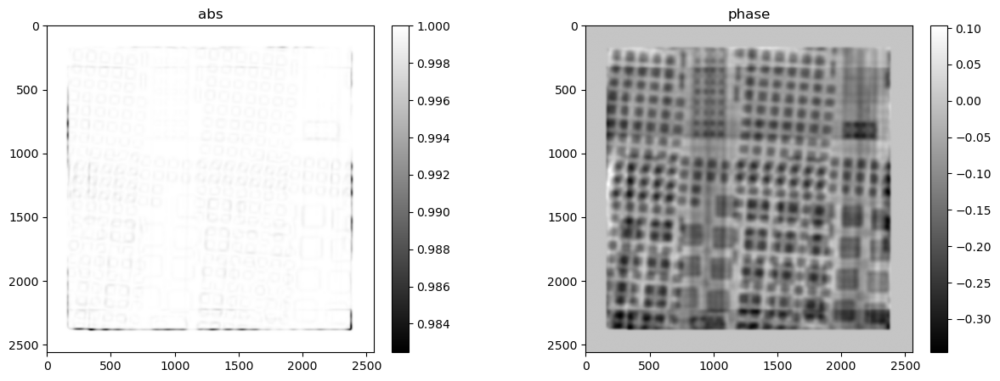

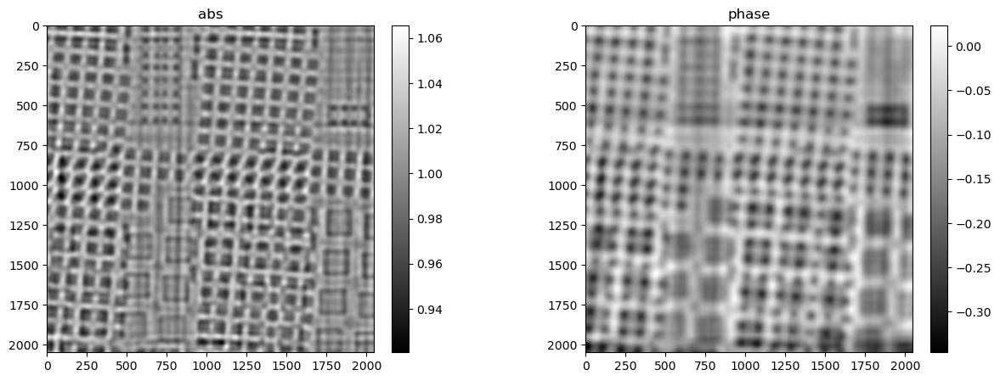

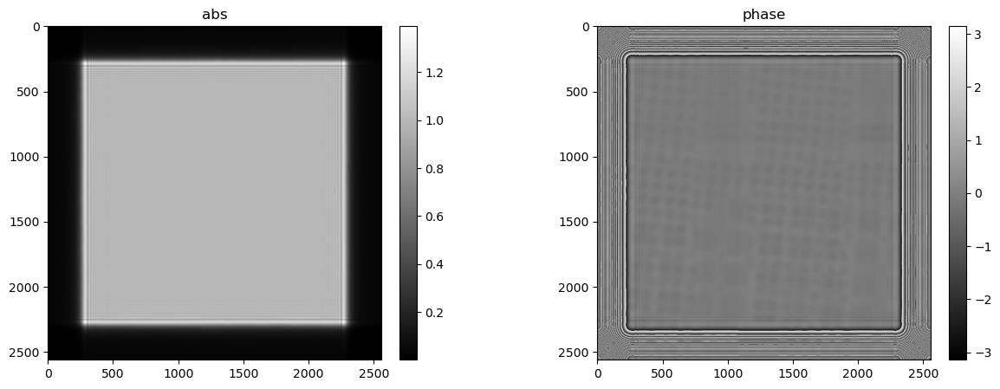

In [7]:
b = cl_rec.S(pos_init.astype('int32')*0,0*pos_init.astype('float32'),cp.array(psi_init))
a = cl_rec.D(b)
c = cl_rec.DT(a)
mshow_polar(b[0],True)
mshow_polar(a[0],True)
mshow_polar(c[0],True)

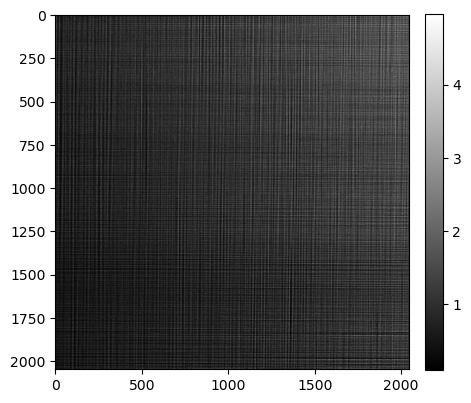

In [8]:
mshow(ref,True)

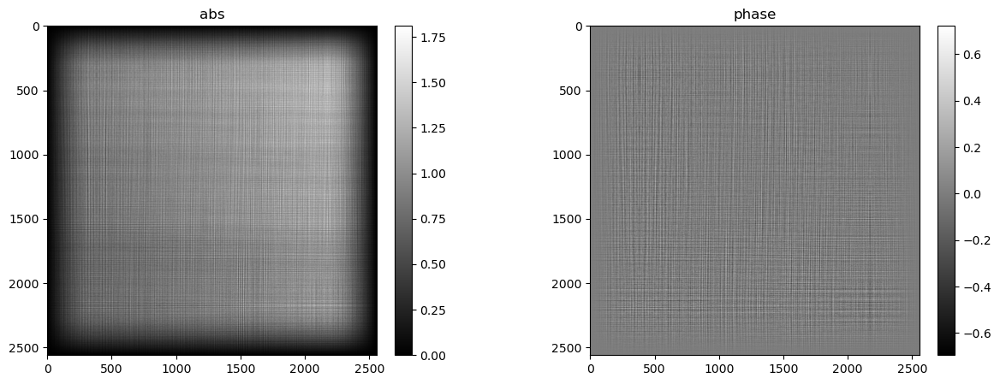

In [9]:
# pref = np.pad(ref,((args.pad,args.pad),(args.pad,args.pad)),'symmetric')
q_init = cp.array(cl_rec.DT(cp.array(np.sqrt(ref[np.newaxis])).astype('complex64'))[0])

ppad = 3 * args.pad // 2
q_init = np.pad(
    q_init[ppad : args.nq - ppad, ppad : args.nq - ppad],
    ((ppad, ppad), (ppad, ppad)),
    "symmetric",
)
v = cp.ones(args.nq, dtype="float32")
vv = cp.sin(cp.linspace(0, cp.pi / 2, ppad))
v[:ppad] = vv
v[args.nq - ppad :] = vv[::-1]
v = cp.outer(v, v)
q_init = cp.abs(q_init * v) * cp.exp(1j * cp.angle(q_init) * v)
vv=[]
mshow_polar(q_init,args.show)

0) err=5.39347e+05


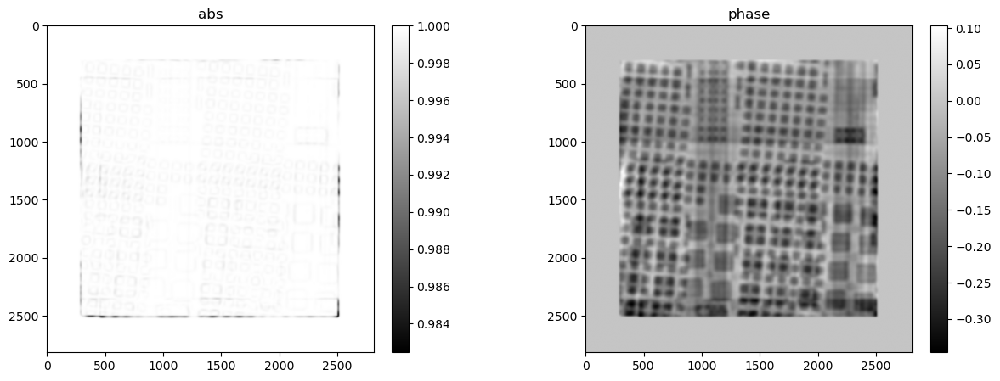

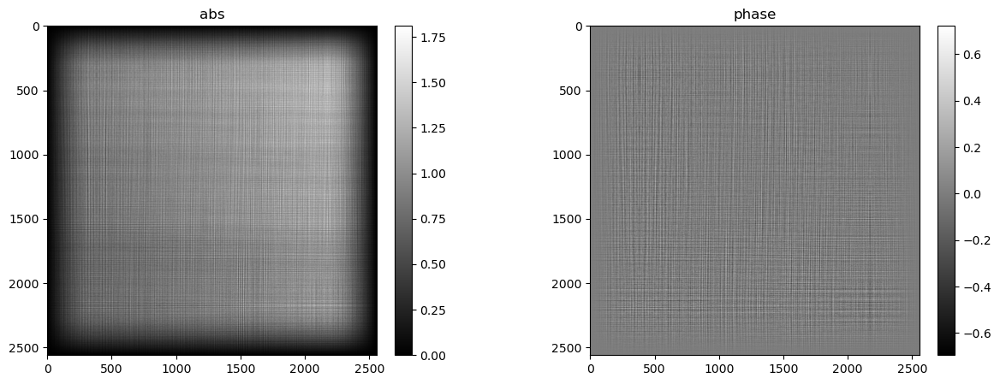

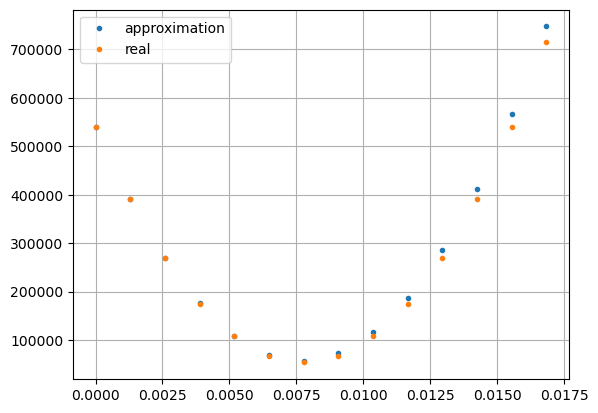

1) err=5.72254e+04
2) err=4.11305e+04
3) err=2.98789e+04
4) err=2.81306e+04
5) err=2.58442e+04
6) err=2.49765e+04
7) err=2.31150e+04
8) err=2.21177e+04
9) err=1.98716e+04
10) err=1.87819e+04
11) err=1.71326e+04
12) err=1.63225e+04
13) err=1.54964e+04
14) err=1.48540e+04
15) err=1.43075e+04
16) err=1.36746e+04
17) err=1.32753e+04
18) err=1.26812e+04
19) err=1.23678e+04
20) err=1.18871e+04
21) err=1.16141e+04
22) err=1.12557e+04
23) err=1.09877e+04
24) err=1.07115e+04
25) err=1.04355e+04
26) err=1.02180e+04
27) err=9.96201e+03
28) err=9.78661e+03
29) err=9.56889e+03
30) err=9.40369e+03
31) err=9.23075e+03
32) err=9.05725e+03
33) err=8.91580e+03
34) err=8.73858e+03
35) err=8.61429e+03
36) err=8.45614e+03
37) err=8.33498e+03
38) err=8.20592e+03
39) err=8.08173e+03
40) err=7.97718e+03
41) err=7.85204e+03
42) err=7.76024e+03
43) err=7.64476e+03
44) err=7.55577e+03
45) err=7.45551e+03
46) err=7.36582e+03
47) err=7.28344e+03
48) err=7.19273e+03
49) err=7.12050e+03
50) err=7.03218e+03
51) err=6

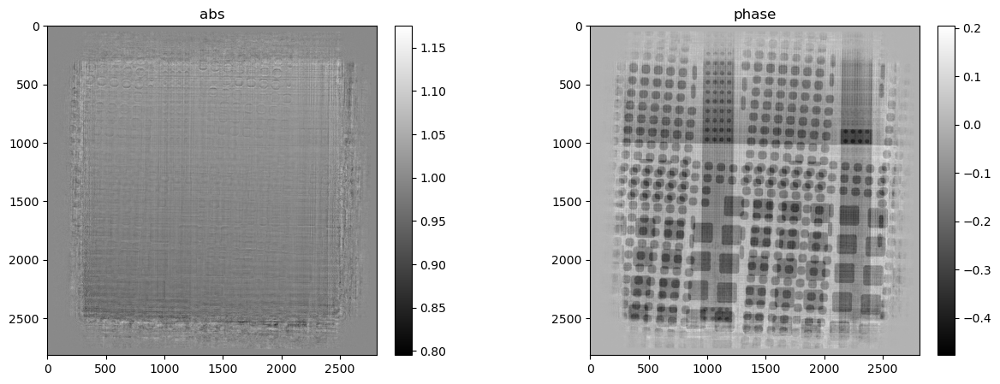

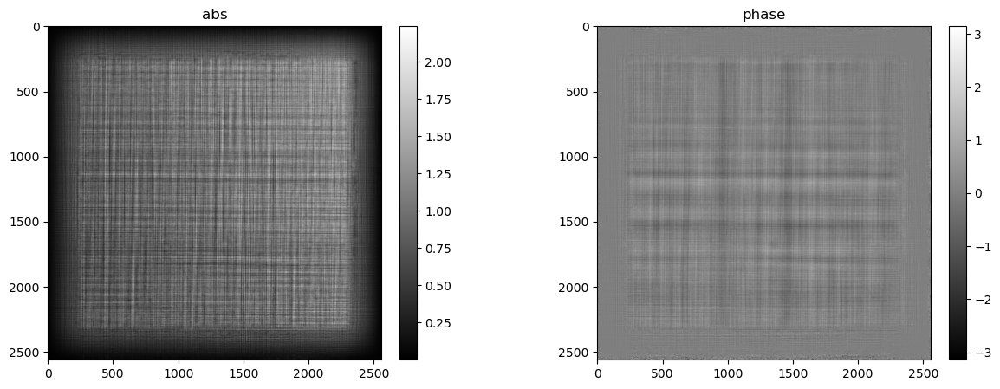

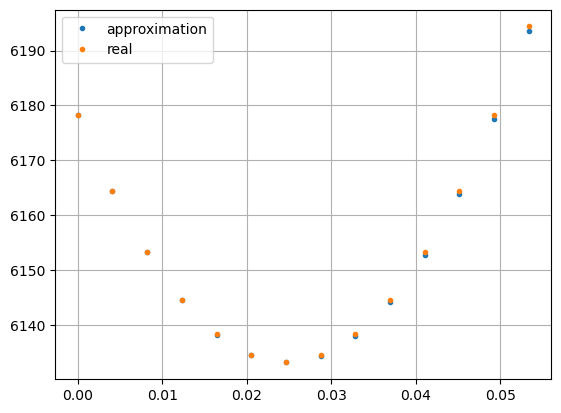

65) err=6.13312e+03
66) err=6.08339e+03
67) err=6.04363e+03
68) err=5.99600e+03
69) err=5.95833e+03
70) err=5.91492e+03
71) err=5.87735e+03
72) err=5.83938e+03
73) err=5.80081e+03
74) err=5.76785e+03
75) err=5.72959e+03
76) err=5.70007e+03
77) err=5.66400e+03
78) err=5.63563e+03
79) err=5.60284e+03
80) err=5.57420e+03
81) err=5.54576e+03
82) err=5.51713e+03
83) err=5.49210e+03
84) err=5.46394e+03
85) err=5.44027e+03
86) err=5.41405e+03
87) err=5.39067e+03
88) err=5.36706e+03
89) err=5.34340e+03
90) err=5.32223e+03
91) err=5.29902e+03
92) err=5.27997e+03
93) err=5.25772e+03
94) err=5.23974e+03
95) err=5.21925e+03
96) err=5.20160e+03
97) err=5.18308e+03
98) err=5.16536e+03
99) err=5.14853e+03
100) err=5.13101e+03
101) err=5.11543e+03
102) err=5.09848e+03
103) err=5.08371e+03
104) err=5.06773e+03
105) err=5.05329e+03
106) err=5.03828e+03
107) err=5.02403e+03
108) err=5.01017e+03
109) err=4.99618e+03
110) err=4.98325e+03
111) err=4.96949e+03
112) err=4.95716e+03
113) err=4.94392e+03
114) e

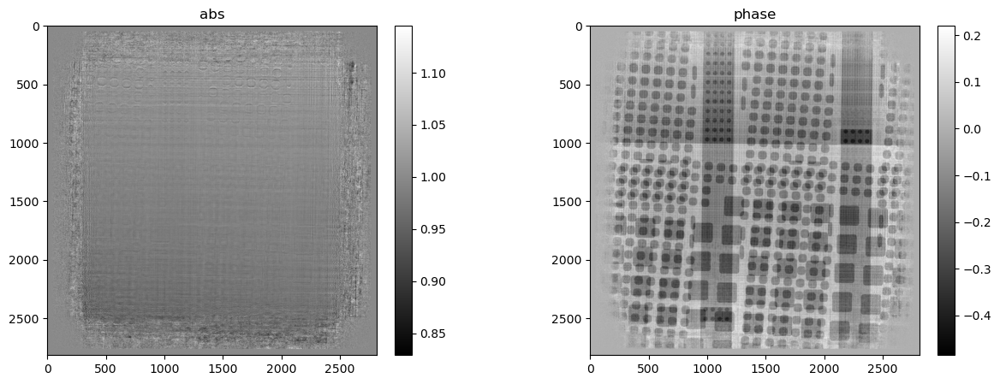

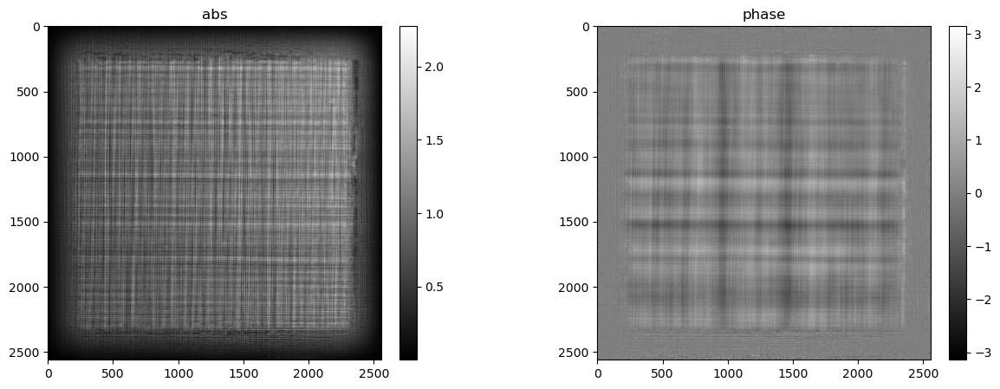

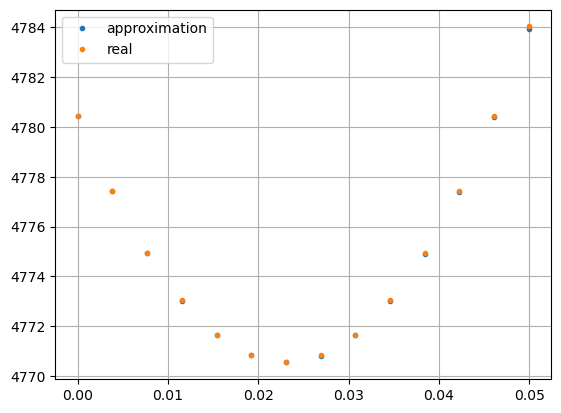

129) err=4.77055e+03
130) err=4.76162e+03
131) err=4.75199e+03
132) err=4.74325e+03
133) err=4.73398e+03
134) err=4.72536e+03
135) err=4.71659e+03
136) err=4.70805e+03
137) err=4.69970e+03
138) err=4.69130e+03
139) err=4.68324e+03
140) err=4.67493e+03
141) err=4.66698e+03
142) err=4.65889e+03
143) err=4.65118e+03
144) err=4.64343e+03
145) err=4.63587e+03
146) err=4.62834e+03
147) err=4.62098e+03
148) err=4.61367e+03
149) err=4.60647e+03
150) err=4.59935e+03
151) err=4.59228e+03
152) err=4.58539e+03
153) err=4.57847e+03
154) err=4.57183e+03
155) err=4.56505e+03
156) err=4.55860e+03
157) err=4.55198e+03
158) err=4.54566e+03
159) err=4.53923e+03
160) err=4.53300e+03
161) err=4.52677e+03
162) err=4.52065e+03
163) err=4.51465e+03
164) err=4.50867e+03
165) err=4.50292e+03
166) err=4.49708e+03
167) err=4.49145e+03
168) err=4.48579e+03
169) err=4.48025e+03
170) err=4.47483e+03
171) err=4.46932e+03
172) err=4.46408e+03
173) err=4.45860e+03
174) err=4.45354e+03
175) err=4.44818e+03
176) err=4.44

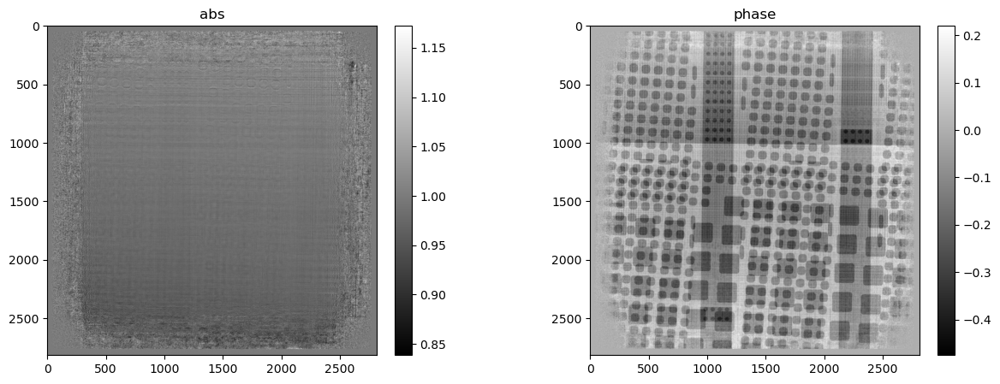

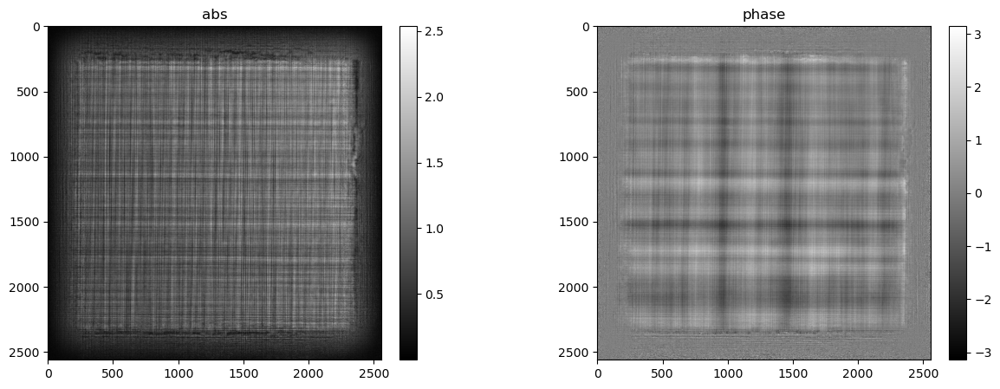

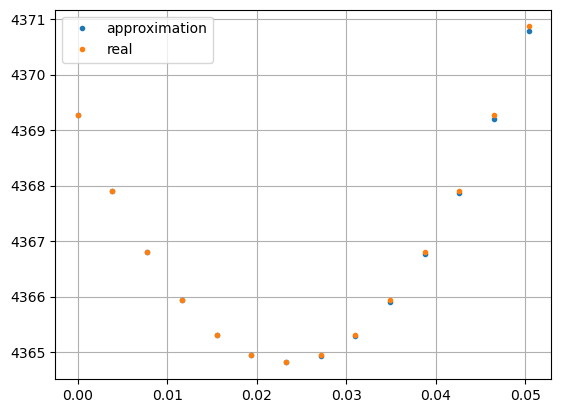

193) err=4.36481e+03
194) err=4.36081e+03
195) err=4.35644e+03
196) err=4.35243e+03
197) err=4.34820e+03
198) err=4.34417e+03
199) err=4.34012e+03
200) err=4.33607e+03
201) err=4.33220e+03
202) err=4.32815e+03
203) err=4.32433e+03
204) err=4.32028e+03
205) err=4.31645e+03
206) err=4.31249e+03
207) err=4.30863e+03
208) err=4.30481e+03
209) err=4.30093e+03
210) err=4.29722e+03
211) err=4.29336e+03
212) err=4.28969e+03
213) err=4.28585e+03
214) err=4.28217e+03
215) err=4.27843e+03
216) err=4.27474e+03
217) err=4.27111e+03
218) err=4.26740e+03
219) err=4.26386e+03
220) err=4.26015e+03
221) err=4.25662e+03
222) err=4.25295e+03
223) err=4.24943e+03
224) err=4.24585e+03
225) err=4.24228e+03
226) err=4.23878e+03
227) err=4.23519e+03
228) err=4.23181e+03
229) err=4.22822e+03
230) err=4.22490e+03
231) err=4.22137e+03
232) err=4.21807e+03
233) err=4.21463e+03
234) err=4.21127e+03
235) err=4.20793e+03
236) err=4.20455e+03
237) err=4.20131e+03
238) err=4.19791e+03
239) err=4.19475e+03
240) err=4.19

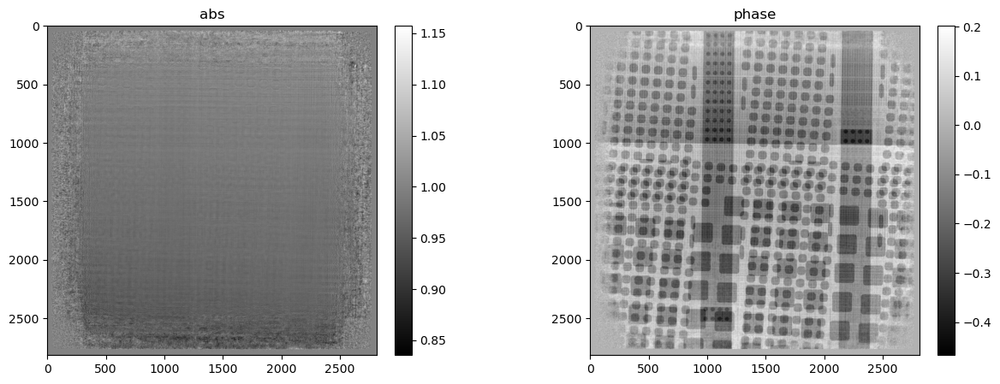

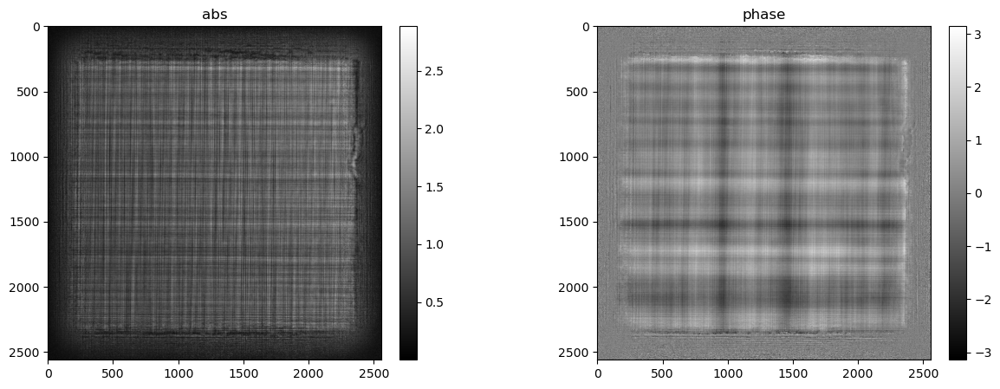

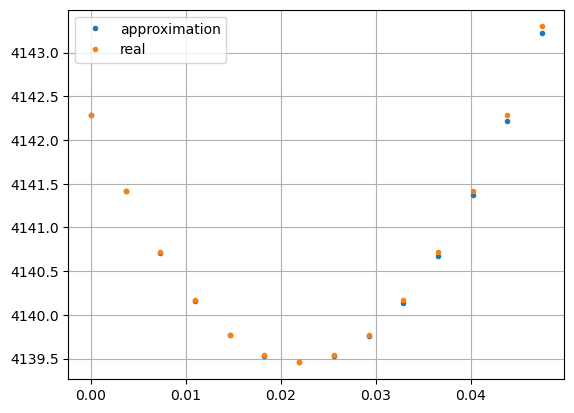

257) err=4.13946e+03
258) err=4.13652e+03
259) err=4.13370e+03
260) err=4.13086e+03
261) err=4.12803e+03
262) err=4.12527e+03
263) err=4.12243e+03
264) err=4.11971e+03
265) err=4.11691e+03
266) err=4.11420e+03
267) err=4.11149e+03
268) err=4.10877e+03
269) err=4.10613e+03
270) err=4.10337e+03
271) err=4.10081e+03
272) err=4.09808e+03
273) err=4.09556e+03
274) err=4.09287e+03
275) err=4.09034e+03
276) err=4.08773e+03
277) err=4.08516e+03
278) err=4.08260e+03
279) err=4.08000e+03
280) err=4.07751e+03
281) err=4.07490e+03
282) err=4.07244e+03
283) err=4.06987e+03
284) err=4.06743e+03
285) err=4.06492e+03
286) err=4.06242e+03
287) err=4.05996e+03
288) err=4.05743e+03
289) err=4.05505e+03
290) err=4.05250e+03
291) err=4.05015e+03
292) err=4.04762e+03
293) err=4.04526e+03
294) err=4.04277e+03
295) err=4.04035e+03
296) err=4.03791e+03
297) err=4.03547e+03
298) err=4.03310e+03
299) err=4.03066e+03
300) err=4.02832e+03
301) err=4.02590e+03
302) err=4.02354e+03
303) err=4.02114e+03
304) err=4.01

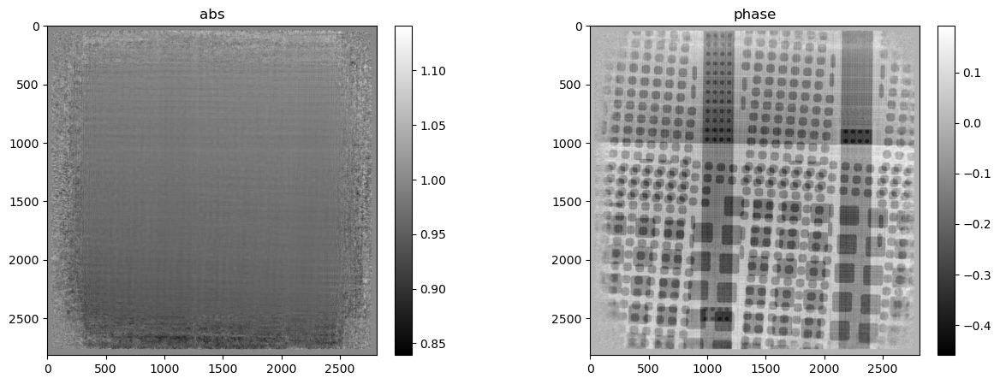

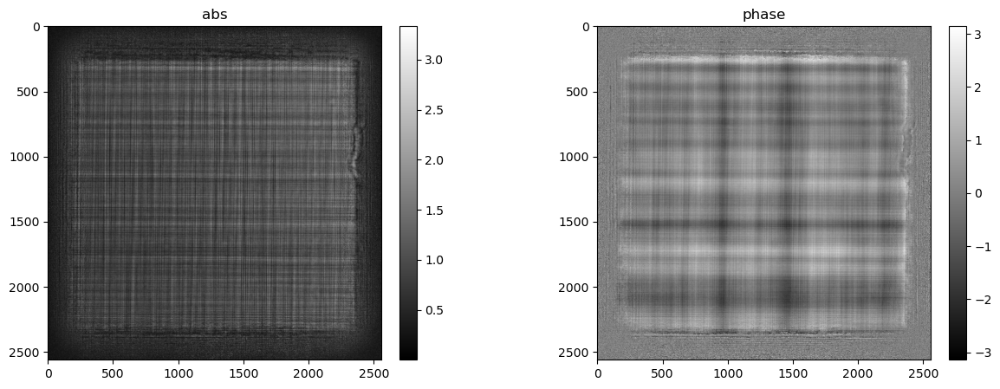

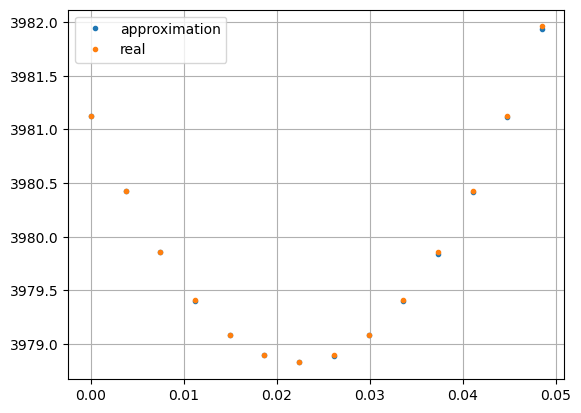

321) err=3.97883e+03
322) err=3.97650e+03
323) err=3.97423e+03
324) err=3.97190e+03
325) err=3.96963e+03
326) err=3.96731e+03
327) err=3.96507e+03
328) err=3.96276e+03
329) err=3.96050e+03
330) err=3.95820e+03
331) err=3.95593e+03
332) err=3.95367e+03
333) err=3.95142e+03
334) err=3.94919e+03
335) err=3.94695e+03
336) err=3.94470e+03
337) err=3.94246e+03
338) err=3.94022e+03
339) err=3.93803e+03
340) err=3.93579e+03
341) err=3.93363e+03
342) err=3.93137e+03
343) err=3.92922e+03
344) err=3.92698e+03
345) err=3.92483e+03
346) err=3.92263e+03
347) err=3.92048e+03
348) err=3.91832e+03
349) err=3.91616e+03
350) err=3.91402e+03
351) err=3.91184e+03
352) err=3.90974e+03
353) err=3.90757e+03
354) err=3.90547e+03
355) err=3.90332e+03
356) err=3.90121e+03
357) err=3.89912e+03
358) err=3.89701e+03
359) err=3.89496e+03
360) err=3.89282e+03
361) err=3.89079e+03
362) err=3.88864e+03
363) err=3.88661e+03
364) err=3.88450e+03
365) err=3.88248e+03
366) err=3.88041e+03
367) err=3.87836e+03
368) err=3.87

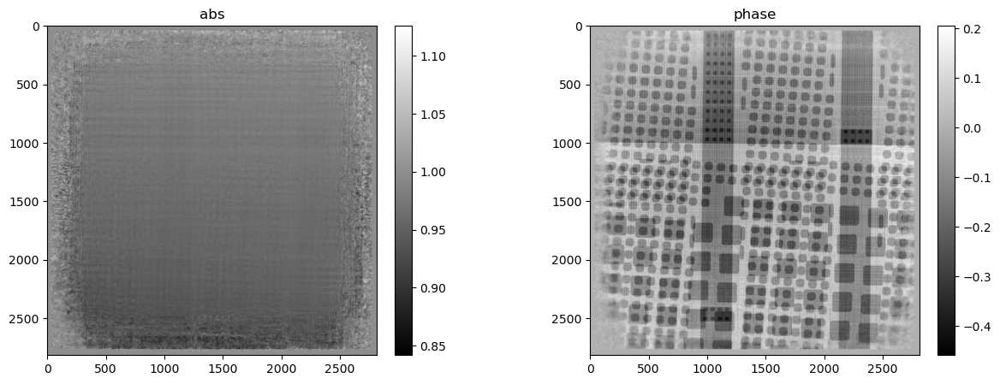

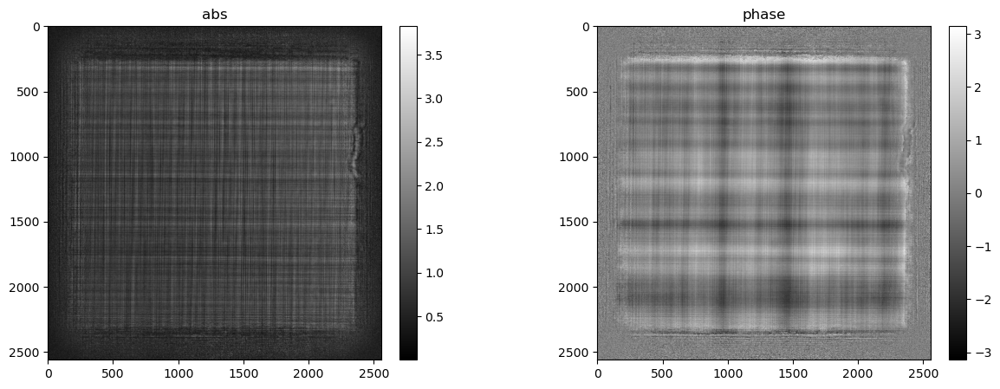

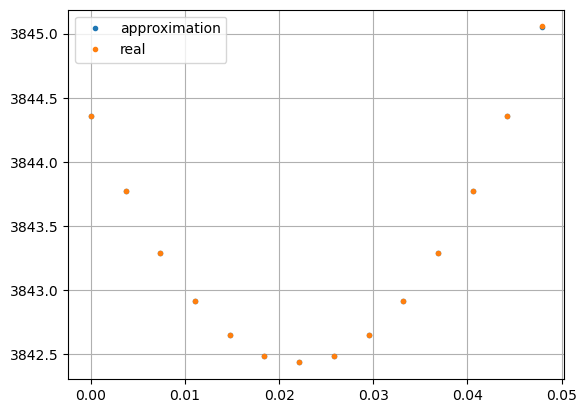

385) err=3.84244e+03
386) err=3.84046e+03
387) err=3.83853e+03
388) err=3.83660e+03
389) err=3.83467e+03
390) err=3.83279e+03
391) err=3.83084e+03
392) err=3.82896e+03
393) err=3.82701e+03
394) err=3.82512e+03
395) err=3.82323e+03
396) err=3.82135e+03
397) err=3.81950e+03
398) err=3.81758e+03
399) err=3.81575e+03
400) err=3.81383e+03
401) err=3.81204e+03
402) err=3.81014e+03
403) err=3.80837e+03
404) err=3.80650e+03
405) err=3.80471e+03
406) err=3.80286e+03
407) err=3.80105e+03
408) err=3.79924e+03
409) err=3.79744e+03
410) err=3.79568e+03
411) err=3.79386e+03
412) err=3.79210e+03
413) err=3.79032e+03
414) err=3.78857e+03
415) err=3.78682e+03
416) err=3.78507e+03
417) err=3.78334e+03
418) err=3.78157e+03
419) err=3.77987e+03
420) err=3.77811e+03
421) err=3.77645e+03
422) err=3.77471e+03
423) err=3.77305e+03
424) err=3.77132e+03
425) err=3.76965e+03
426) err=3.76796e+03
427) err=3.76631e+03
428) err=3.76465e+03
429) err=3.76298e+03
430) err=3.76135e+03
431) err=3.75968e+03
432) err=3.75

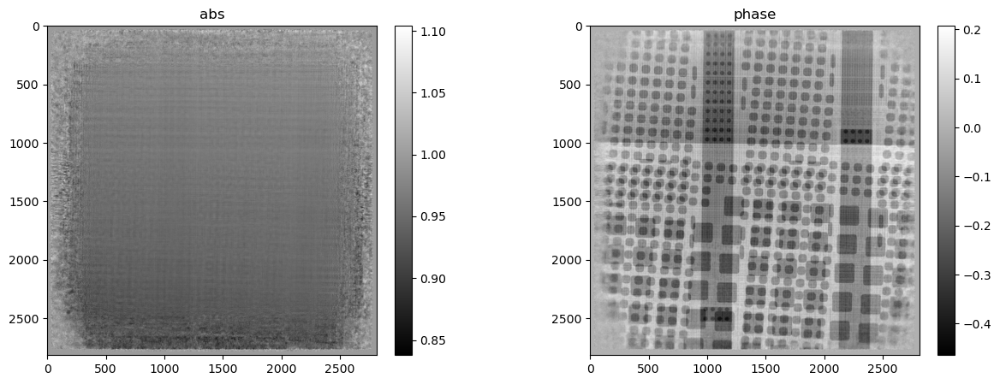

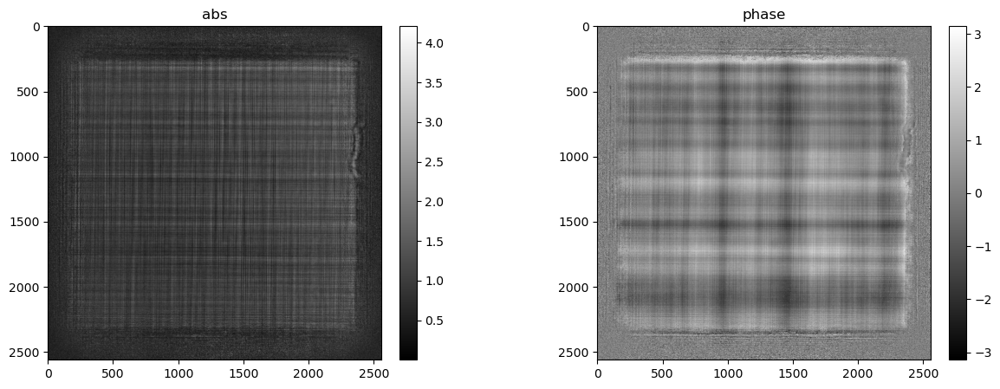

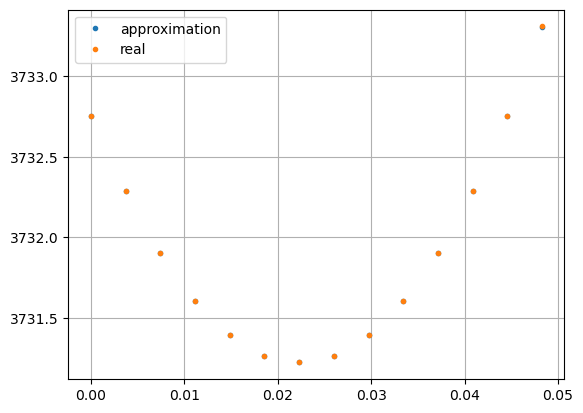

449) err=3.73123e+03
450) err=3.72969e+03
451) err=3.72817e+03
452) err=3.72666e+03
453) err=3.72514e+03
454) err=3.72363e+03
455) err=3.72211e+03
456) err=3.72061e+03
457) err=3.71911e+03
458) err=3.71763e+03
459) err=3.71616e+03
460) err=3.71467e+03
461) err=3.71319e+03
462) err=3.71170e+03
463) err=3.71025e+03
464) err=3.70877e+03
465) err=3.70733e+03
466) err=3.70586e+03
467) err=3.70443e+03
468) err=3.70297e+03
469) err=3.70153e+03
470) err=3.70009e+03
471) err=3.69865e+03
472) err=3.69722e+03
473) err=3.69580e+03
474) err=3.69438e+03
475) err=3.69295e+03
476) err=3.69154e+03
477) err=3.69012e+03
478) err=3.68871e+03
479) err=3.68731e+03
480) err=3.68591e+03
481) err=3.68451e+03
482) err=3.68312e+03
483) err=3.68173e+03
484) err=3.68034e+03
485) err=3.67896e+03
486) err=3.67757e+03
487) err=3.67620e+03
488) err=3.67482e+03
489) err=3.67347e+03
490) err=3.67209e+03
491) err=3.67075e+03
492) err=3.66938e+03
493) err=3.66803e+03
494) err=3.66668e+03
495) err=3.66534e+03
496) err=3.66

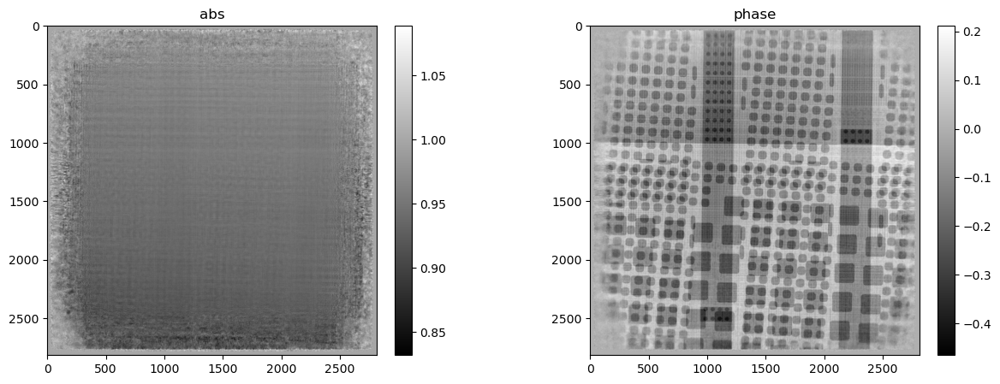

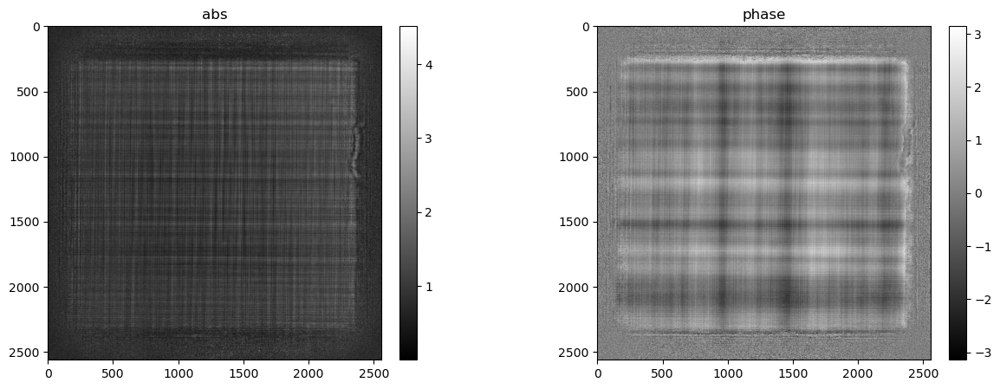

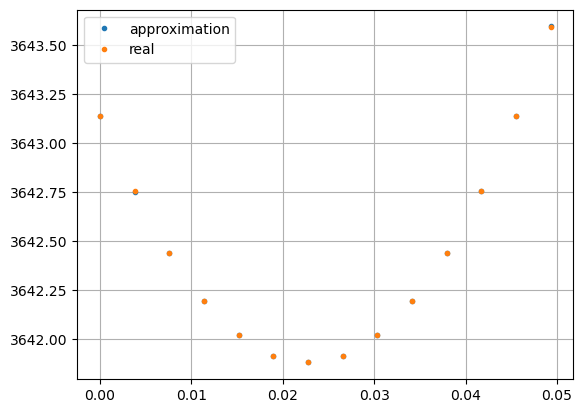

513) err=3.64188e+03
514) err=3.64062e+03
515) err=3.63937e+03
516) err=3.63810e+03
517) err=3.63686e+03


KeyboardInterrupt: 

: 

In [10]:
# variables

vars = {}
vars["psi"] = cp.array(psi_init)
vars["q"] = cp.array(q_init)
vars["ri"] = np.round(pos_init).astype("int32")
vars["r"] = np.array(pos_init - vars["ri"]).astype("float32")
vars["r_init"] = np.array(pos_init - vars["ri"]).astype("float32")
vars["table"] = pd.DataFrame(columns=["iter", "err", "time"])

# pdata = np.pad(data,((0,0),(args.pad,args.pad),(args.pad,args.pad)),'constant',constant_values=1)
# v = np.ones(args.nq,dtype='float32')
# v[:args.pad] = np.sin(np.linspace(0,1,args.pad)*cp.pi/2)
# v[-args.pad:] = np.cos(np.linspace(0,1,args.pad)*cp.pi/2)
# v = np.outer(v,v)
# pdata *= v#*2        
# reconstruction
vars = cl_rec.BH(data, vars)


In [ ]:
# results
erra = vars["table"]["err"].values
plt.plot(erra)
plt.yscale("log")
plt.grid()
mshow_polar(vars["psi"],args.show)
mshow_polar(vars["q"],args.show)
pos_rec = vars["ri"] + vars["r"]
if args.show:
    plt.plot((pos_init[:, 1] - pos_rec[:, 1]), ".", label="x difference")
    plt.plot((pos_init[:, 0] - pos_rec[:, 0]), ".", label="y difference")
    plt.legend()
    plt.grid()
    plt.plot()